In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
pd.options.display.max_columns=None

In [2]:
df=pd.read_csv('knn_prediction.csv')

In [3]:
df

,user_id,age_7,clicks_user_period_5,favourites_user_merchant_ratio,clicks_user_merchant_period_5,clicks_user_ratio,clicks_user_merchant_ratio,double11_purchases_user_merchant,action_types_user_merchant,double11_purchases_user,favourites_user_ratio,action_types_user,clicks_merchant_period_mean,clicks_user,clicks_merchant,clicks_merchant_period_3,users_merchant,gender,clicks_merchant_period_2,favourites_merchant_period_4,double11_clicks_user,favourites_merchant_period_5,clicks_merchant_period_4,double11_clicks_user_merchant,purchases_merchant_ratio,clicks_user_period_mean,double11_brands_merchant,clicks_user_period_max,clicks_merchant_ratio,clicks_user_merchant,pca_0,pca_1,pca_2,pca_3,pca_4,pred
0,64128,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,570.200000,1,2851,1130.0,1309,1,731.0,5.0,0.0,4.0,106.0,0.0,0.235015,1.0,1.0,1,0.752839,1,150624.514147,1932.078129,-6.342981,-0.204365,-0.828412,0
1,18816,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,49.600000,1,248,48.0,159,1,49.0,0.0,0.0,1.0,21.0,0.0,0.125000,1.0,0.0,1,0.815789,1,195937.875858,-1212.552444,-8.231880,-3.074206,-6.197004,0
2,403329,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,34.400000,1,172,34.0,121,0,76.0,0.0,0.0,0.0,3.0,0.0,0.011111,1.0,0.0,1,0.955556,1,-188575.054755,-1456.918593,-32.035945,29.514069,17.190906,0
3,279681,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,5.400000,1,27,3.0,12,0,3.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,1,0.931034,1,-64926.984689,-1593.498656,-75.830243,-4.227555,-12.730230,0
4,217473,0,1.0,0.00,1.0,1.00,1.00,0.0,1,0.0,0.00,1,103.333333,1,310,1.0,227,0,0.0,0.0,1.0,11.0,24.0,1.0,0.038922,1.0,1.0,1,0.928144,1,-2719.129714,-1240.286722,88.111484,-25.966172,-58.708335,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4521,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0
4522,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0
4523,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0
4524,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0


In [4]:
df2=pd.read_csv('final_processed_data.csv')

In [5]:
df2=df2[df2['kind']=='test']

In [6]:
df2

,user_id,age_range,gender,merchant_id,label,kind,item_id,category_id,brand_id,time_stamp,action_type
4636,64128,4,1,4255,-1,test,866,1213,1573,722,0
4637,18816,2,1,3462,-1,test,916,563,2997,706,0
4638,403329,6,0,202,-1,test,870,662,7614,630,0
4639,279681,4,0,1461,-1,test,855,1228,6220,621,0
4640,217473,4,0,2116,-1,test,867,656,7334,1111,0
...,...,...,...,...,...,...,...,...,...,...,...
9157,340607,6,1,2692,-1,test,802,1075,6343,809,0
9158,340607,6,1,2692,-1,test,802,1075,6343,809,3
9159,340607,6,1,2692,-1,test,802,1075,6343,809,0
9160,340607,6,1,2692,-1,test,802,1075,6343,809,0


In [7]:
df2['time_stamp'] = (pd.to_datetime(df2['time_stamp'], format='%m%d') - pd.to_datetime(df2['time_stamp'].min(), format='%m%d')).dt.days

In [8]:
df2

,user_id,age_range,gender,merchant_id,label,kind,item_id,category_id,brand_id,time_stamp,action_type
4636,64128,4,1,4255,-1,test,866,1213,1573,71,0
4637,18816,2,1,3462,-1,test,916,563,2997,55,0
4638,403329,6,0,202,-1,test,870,662,7614,49,0
4639,279681,4,0,1461,-1,test,855,1228,6220,40,0
4640,217473,4,0,2116,-1,test,867,656,7334,183,0
...,...,...,...,...,...,...,...,...,...,...,...
9157,340607,6,1,2692,-1,test,802,1075,6343,89,0
9158,340607,6,1,2692,-1,test,802,1075,6343,89,3
9159,340607,6,1,2692,-1,test,802,1075,6343,89,0
9160,340607,6,1,2692,-1,test,802,1075,6343,89,0


In [9]:
df_merged = pd.merge(df, df2, on='user_id')

In [10]:
df_merged

,user_id,age_7,clicks_user_period_5,favourites_user_merchant_ratio,clicks_user_merchant_period_5,clicks_user_ratio,clicks_user_merchant_ratio,double11_purchases_user_merchant,action_types_user_merchant,double11_purchases_user,favourites_user_ratio,action_types_user,clicks_merchant_period_mean,clicks_user,clicks_merchant,clicks_merchant_period_3,users_merchant,gender_x,clicks_merchant_period_2,favourites_merchant_period_4,double11_clicks_user,favourites_merchant_period_5,clicks_merchant_period_4,double11_clicks_user_merchant,purchases_merchant_ratio,clicks_user_period_mean,double11_brands_merchant,clicks_user_period_max,clicks_merchant_ratio,clicks_user_merchant,pca_0,pca_1,pca_2,pca_3,pca_4,pred,age_range,gender_y,merchant_id,label,kind,item_id,category_id,brand_id,time_stamp,action_type
0,64128,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,570.200000,1,2851,1130.0,1309,1,731.0,5.0,0.0,4.0,106.0,0.0,0.235015,1.0,1.0,1,0.752839,1,150624.514147,1932.078129,-6.342981,-0.204365,-0.828412,0,4,1,4255,-1,test,866,1213,1573,71,0
1,18816,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,49.600000,1,248,48.0,159,1,49.0,0.0,0.0,1.0,21.0,0.0,0.125000,1.0,0.0,1,0.815789,1,195937.875858,-1212.552444,-8.231880,-3.074206,-6.197004,0,2,1,3462,-1,test,916,563,2997,55,0
2,403329,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,34.400000,1,172,34.0,121,0,76.0,0.0,0.0,0.0,3.0,0.0,0.011111,1.0,0.0,1,0.955556,1,-188575.054755,-1456.918593,-32.035945,29.514069,17.190906,0,6,0,202,-1,test,870,662,7614,49,0
3,279681,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,5.400000,1,27,3.0,12,0,3.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,1,0.931034,1,-64926.984689,-1593.498656,-75.830243,-4.227555,-12.730230,0,4,0,1461,-1,test,855,1228,6220,40,0
4,217473,0,1.0,0.00,1.0,1.00,1.00,0.0,1,0.0,0.00,1,103.333333,1,310,1.0,227,0,0.0,0.0,1.0,11.0,24.0,1.0,0.038922,1.0,1.0,1,0.928144,1,-2719.129714,-1240.286722,88.111484,-25.966172,-58.708335,0,4,0,2116,-1,test,867,656,7334,183,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23723,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,1,2692,-1,test,802,1075,6343,89,0
23724,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,1,2692,-1,test,802,1075,6343,89,3
23725,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,1,2692,-1,test,802,1075,6343,89,0
23726,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,1,2692,-1,test,802,1075,6343,89,0


In [11]:
df_merged.drop('gender_y', axis =1,inplace=True)

In [12]:
df_merged.drop('label', axis =1,inplace=True)

In [13]:
df_merged

,user_id,age_7,clicks_user_period_5,favourites_user_merchant_ratio,clicks_user_merchant_period_5,clicks_user_ratio,clicks_user_merchant_ratio,double11_purchases_user_merchant,action_types_user_merchant,double11_purchases_user,favourites_user_ratio,action_types_user,clicks_merchant_period_mean,clicks_user,clicks_merchant,clicks_merchant_period_3,users_merchant,gender_x,clicks_merchant_period_2,favourites_merchant_period_4,double11_clicks_user,favourites_merchant_period_5,clicks_merchant_period_4,double11_clicks_user_merchant,purchases_merchant_ratio,clicks_user_period_mean,double11_brands_merchant,clicks_user_period_max,clicks_merchant_ratio,clicks_user_merchant,pca_0,pca_1,pca_2,pca_3,pca_4,pred,age_range,merchant_id,kind,item_id,category_id,brand_id,time_stamp,action_type
0,64128,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,570.200000,1,2851,1130.0,1309,1,731.0,5.0,0.0,4.0,106.0,0.0,0.235015,1.0,1.0,1,0.752839,1,150624.514147,1932.078129,-6.342981,-0.204365,-0.828412,0,4,4255,test,866,1213,1573,71,0
1,18816,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,49.600000,1,248,48.0,159,1,49.0,0.0,0.0,1.0,21.0,0.0,0.125000,1.0,0.0,1,0.815789,1,195937.875858,-1212.552444,-8.231880,-3.074206,-6.197004,0,2,3462,test,916,563,2997,55,0
2,403329,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,34.400000,1,172,34.0,121,0,76.0,0.0,0.0,0.0,3.0,0.0,0.011111,1.0,0.0,1,0.955556,1,-188575.054755,-1456.918593,-32.035945,29.514069,17.190906,0,6,202,test,870,662,7614,49,0
3,279681,0,0.0,0.00,0.0,1.00,1.00,0.0,1,0.0,0.00,1,5.400000,1,27,3.0,12,0,3.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,1,0.931034,1,-64926.984689,-1593.498656,-75.830243,-4.227555,-12.730230,0,4,1461,test,855,1228,6220,40,0
4,217473,0,1.0,0.00,1.0,1.00,1.00,0.0,1,0.0,0.00,1,103.333333,1,310,1.0,227,0,0.0,0.0,1.0,11.0,24.0,1.0,0.038922,1.0,1.0,1,0.928144,1,-2719.129714,-1240.286722,88.111484,-25.966172,-58.708335,0,4,2116,test,867,656,7334,183,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23723,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,2692,test,802,1075,6343,89,0
23724,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,2692,test,802,1075,6343,89,3
23725,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,2692,test,802,1075,6343,89,0
23726,340607,0,0.0,0.25,0.0,0.75,0.75,0.0,2,0.0,0.25,2,62.400000,3,312,63.0,237,1,168.0,0.0,0.0,0.0,11.0,0.0,0.041420,3.0,1.0,3,0.923077,3,-125853.142954,-1238.112872,12.471900,74.640347,63.747494,0,6,2692,test,802,1075,6343,89,0


In [16]:
sns.pairplot(df_merged)

In [14]:
df_1=df_merged[df_merged['pred']==1]

<AxesSubplot:xlabel='pred', ylabel='count'>

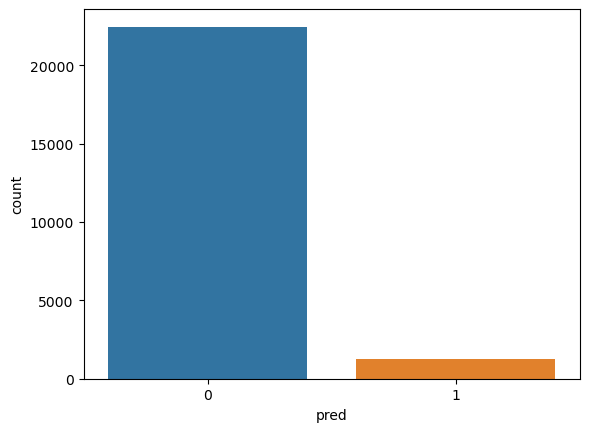

In [15]:
sns.countplot(x='pred', data=df_merged)

<AxesSubplot:xlabel='age_range', ylabel='Count'>

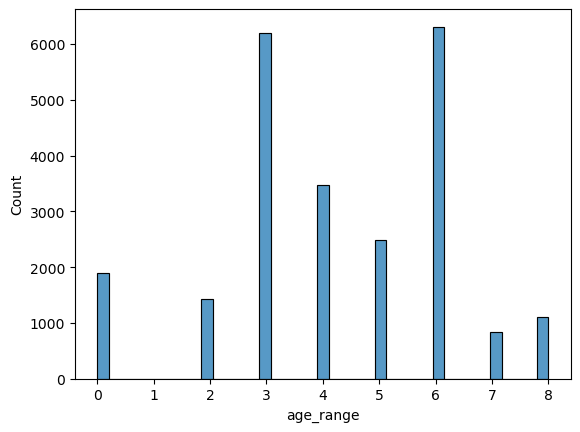

In [16]:
sns.histplot(data=df_merged, x='age_range')

In [17]:
df_1

,user_id,age_7,clicks_user_period_5,favourites_user_merchant_ratio,clicks_user_merchant_period_5,clicks_user_ratio,clicks_user_merchant_ratio,double11_purchases_user_merchant,action_types_user_merchant,double11_purchases_user,favourites_user_ratio,action_types_user,clicks_merchant_period_mean,clicks_user,clicks_merchant,clicks_merchant_period_3,users_merchant,gender_x,clicks_merchant_period_2,favourites_merchant_period_4,double11_clicks_user,favourites_merchant_period_5,clicks_merchant_period_4,double11_clicks_user_merchant,purchases_merchant_ratio,clicks_user_period_mean,double11_brands_merchant,clicks_user_period_max,clicks_merchant_ratio,clicks_user_merchant,pca_0,pca_1,pca_2,pca_3,pca_4,pred,age_range,merchant_id,kind,item_id,category_id,brand_id,time_stamp,action_type
378,261771,0,0.0,0.0,0.0,1.0,1.0,0.0,1,0.0,0.0,1,105.250000,1,421,105.0,336,1,4.0,6.0,0.0,15.0,86.0,0.0,0.033898,1.0,1.0,1,0.891949,1,-47017.198587,-1090.052869,103.508280,-104.686694,0.329880,1,2,1393,test,862,1389,4705,116,0
460,372108,0,0.0,0.0,0.0,1.0,1.0,0.0,1,0.0,0.0,1,48.000000,1,288,13.0,213,1,72.0,0.0,0.0,1.0,4.0,0.0,0.081571,1.0,1.0,1,0.870091,1,-157354.109979,-1320.328067,48.847518,33.879644,-1.810406,1,3,4818,test,954,407,7606,45,0
515,99222,0,0.0,0.0,0.0,1.0,1.0,0.0,1,0.0,0.0,1,34.666667,2,208,28.0,153,0,32.0,1.0,0.0,0.0,8.0,0.0,0.029536,2.0,1.0,2,0.877637,2,115531.904322,-1295.654136,1.832254,-3.092352,-6.427797,1,4,1078,test,826,737,8099,16,0
516,99222,0,0.0,0.0,0.0,1.0,1.0,0.0,1,0.0,0.0,1,34.666667,2,208,28.0,153,0,32.0,1.0,0.0,0.0,8.0,0.0,0.029536,2.0,1.0,2,0.877637,2,115531.904322,-1295.654136,1.832254,-3.092352,-6.427797,1,4,1078,test,826,737,8099,12,0
517,99222,0,0.0,0.0,0.0,1.0,1.0,0.0,1,0.0,0.0,1,34.666667,2,208,28.0,153,0,32.0,1.0,0.0,0.0,8.0,0.0,0.029536,2.0,1.0,2,0.877637,2,115531.904322,-1295.654136,1.832254,-3.092352,-6.427797,1,4,1078,test,826,737,8099,16,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23581,98675,0,0.0,0.0,0.0,1.0,1.0,0.0,1,0.0,0.0,1,9.750000,1,39,2.0,28,1,4.0,1.0,0.0,1.0,5.0,0.0,0.046512,1.0,2.0,1,0.906977,1,116078.991480,-1498.958089,-64.955436,-6.688533,-9.867164,1,3,4187,test,854,1188,6762,134,0
23626,44666,0,0.0,0.0,0.0,0.5,0.5,0.0,2,0.0,0.0,2,570.200000,1,2851,1130.0,1309,0,731.0,5.0,0.0,4.0,106.0,0.0,0.235015,1.0,1.0,1,0.752839,1,170086.512332,1940.479991,-6.538913,-0.210092,-0.819389,1,8,4255,test,866,1213,1573,61,0
23627,44666,0,0.0,0.0,0.0,0.5,0.5,0.0,2,0.0,0.0,2,570.200000,1,2851,1130.0,1309,0,731.0,5.0,0.0,4.0,106.0,0.0,0.235015,1.0,1.0,1,0.752839,1,170086.512332,1940.479991,-6.538913,-0.210092,-0.819389,1,8,4255,test,866,1213,1573,61,2
23628,44666,0,0.0,0.0,0.0,0.5,0.5,0.0,2,0.0,0.0,2,570.200000,1,2851,1130.0,1309,0,731.0,5.0,0.0,4.0,106.0,0.0,0.235015,1.0,1.0,1,0.752839,1,170086.512332,1940.479991,-6.538913,-0.210092,-0.819389,1,8,4255,test,866,1213,1573,61,0


In [18]:
sns.pairplot(df_1)

In [19]:
g = sns.pairplot(df_1, height=2.5)

# set labels for each plot
for i, j in zip(*np.triu_indices_from(g.axes, 1)):
    g.axes[i, j].set_xlabel(df_1.columns[i])
    g.axes[i, j].set_ylabel(df_1.columns[j])

# add legend
handles = g._legend_data.values()
labels = g._legend_data.keys()
g.fig.legend(handles=handles, labels=labels, loc='upper right')

# show plot
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
